##### ARTI 560 - Computer Vision

## Instance Segmentation - Exercise

### Objective

In this exercise, you will implement **Instance Object Segmentation** using a pretrained **Mask R-CNN model** from TensorFlow Hub.

You will follow these steps:

1. **Load the pretrained Mask R-CNN model**  
   - Use this Kaggle link: [Mask R-CNN Inception-ResNet-v2](https://www.kaggle.com/models/tensorflow/mask-rcnn-inception-resnet-v2)  

2. **Select and load 5 different images**  
   - Choose **5 diverse images**, including:  
      - Crowded scenes with multiple objects  
      - Unusual angles, lighting conditions, or occlusions  
      - At least **one image containing multiple objects of the same class**

3. **Perform inference using the model**  
   - Feed images to the model to obtain predictions  

4. **Extract prediction outputs**  
   - **Bounding boxes** – coordinates of detected objects  
   - **Class labels** – names of detected objects  
   - **Segmentation masks** – pixel-wise masks for each object  

5. **Visualize the results**  
   - Overlay masks on detected objects  
   - Draw bounding boxes around objects  
   - Display class names and confidence scores  

6. **Experiment with confidence thresholds**  
   - Default threshold: **0.5**  
   - Lower threshold: **0.3** to detect more objects (may include false positives)  

---

- Keep in mind:  
  - Some objects may not be recognized at the default threshold
  - The model only detects objects from the **COCO dataset (80 classes)**  


In [ ]:
!pip -q install tensorflow tensorflow-hub pillow matplotlib
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
COCO_LABELS = {
    1: 'person', 2: 'bicycle', 3: 'car', 4: 'motorcycle', 5: 'airplane',
    6: 'bus', 7: 'train', 8: 'truck', 9: 'boat', 10: 'traffic light',
    11: 'fire hydrant', 13: 'stop sign', 14: 'parking meter', 15: 'bench',
    16: 'bird', 17: 'cat', 18: 'dog', 19: 'horse', 20: 'sheep', 21: 'cow',
    22: 'elephant', 23: 'bear', 24: 'zebra', 25: 'giraffe', 27: 'backpack',
    28: 'umbrella', 31: 'handbag', 32: 'tie', 33: 'suitcase', 34: 'frisbee',
    35: 'skis', 36: 'snowboard', 37: 'sports ball', 38: 'kite', 39: 'baseball bat',
    40: 'baseball glove', 41: 'skateboard', 42: 'surfboard', 43: 'tennis racket',
    44: 'bottle', 46: 'wine glass', 47: 'cup', 48: 'fork', 49: 'knife',
    50: 'spoon', 51: 'bowl', 52: 'banana', 53: 'apple', 54: 'sandwich',
    55: 'orange', 56: 'broccoli', 57: 'carrot', 58: 'hot dog', 59: 'pizza',
    60: 'donut', 61: 'cake', 62: 'chair', 63: 'couch', 64: 'potted plant',
    65: 'bed', 67: 'dining table', 70: 'toilet', 72: 'tv', 73: 'laptop',
    74: 'mouse', 75: 'remote', 76: 'keyboard', 77: 'cell phone', 78: 'microwave',
    79: 'oven', 80: 'toaster', 81: 'sink', 82: 'refrigerator', 84: 'book',
    85: 'clock', 86: 'vase', 87: 'scissors', 88: 'teddy bear', 89: 'hair drier',
    90: 'toothbrush'
}

In [ ]:
MODEL_HANDLE = "https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1"

print("Loading model...")
detector = hub.load(MODEL_HANDLE)
print("Model loaded.")

Loading model...
Model loaded.


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 000000001296.jpg to 000000001296.jpg
Saving 000000000724.jpg to 000000000724.jpg
Saving 000000000285.jpg to 000000000285.jpg
Saving 000000000785.jpg to 000000000785.jpg
Saving 000000001000.jpg to 000000001000.jpg


In [ ]:
image_paths = [
    "/content/000000001296.jpg",
    "/content/000000000724.jpg",
    "/content/000000000285.jpg",
    "/content/000000000785.jpg",
    "/content/000000001000.jpg"
]

print("Using these 5 images:")
for p in image_paths:
    print(p, os.path.exists(p))

Using these 5 images:
/content/000000001296.jpg True
/content/000000000724.jpg True
/content/000000000285.jpg True
/content/000000000785.jpg True
/content/000000001000.jpg True


In [ ]:
def load_image(path):
    image = Image.open(path).convert("RGB")
    return np.array(image)

def run_inference(detector, image_np):
    input_tensor = tf.convert_to_tensor(image_np, dtype=tf.uint8)
    input_tensor = input_tensor[tf.newaxis, ...]
    outputs = detector(input_tensor)
    outputs = {k: v.numpy() for k, v in outputs.items()}
    return outputs

def box_to_pixels(box, height, width):
    ymin, xmin, ymax, xmax = box
    return (
        int(ymin * height),
        int(xmin * width),
        int(ymax * height),
        int(xmax * width),
    )

def build_full_mask(box_mask, box, image_shape, threshold=0.5):
    h, w = image_shape[:2]
    ymin, xmin, ymax, xmax = box_to_pixels(box, h, w)

    ymin = max(0, ymin)
    xmin = max(0, xmin)
    ymax = min(h, ymax)
    xmax = min(w, xmax)

    if ymax <= ymin or xmax <= xmin:
        return np.zeros((h, w), dtype=np.uint8)

    box_h = ymax - ymin
    box_w = xmax - xmin

    mask_resized = tf.image.resize(
        box_mask[..., np.newaxis],
        (box_h, box_w),
        method="bilinear"
    ).numpy().squeeze()

    binary_mask = (mask_resized > threshold).astype(np.uint8)

    full_mask = np.zeros((h, w), dtype=np.uint8)
    full_mask[ymin:ymax, xmin:xmax] = binary_mask
    return full_mask

def draw_detections(image_np, outputs, score_thresh=0.5):
    image = Image.fromarray(image_np.copy())
    draw = ImageDraw.Draw(image)

    boxes = outputs["detection_boxes"][0]
    classes = outputs["detection_classes"][0].astype(np.int32)
    scores = outputs["detection_scores"][0]
    raw_masks = outputs.get("detection_masks", [None])[0]

    h, w = image_np.shape[:2]
    overlay = image_np.copy()

    for i in range(len(scores)):
        if scores[i] < score_thresh:
            continue

        box = boxes[i]
        class_id = classes[i]
        score = scores[i]
        label = COCO_LABELS.get(class_id, f"class_{class_id}")

        ymin, xmin, ymax, xmax = box_to_pixels(box, h, w)

        draw.rectangle([xmin, ymin, xmax, ymax], outline="red", width=3)
        draw.text((xmin, max(0, ymin - 15)), f"{label}: {score:.2f}", fill="yellow")

        if raw_masks is not None:
            full_mask = build_full_mask(raw_masks[i], box, image_np.shape)
            color = np.array([0, 255, 0], dtype=np.uint8)
            overlay[full_mask == 1] = (
                0.6 * overlay[full_mask == 1] + 0.4 * color
            ).astype(np.uint8)

    blended = Image.blend(Image.fromarray(overlay), image, alpha=0.7)
    return np.array(blended)

def extract_predictions(outputs, image_np, threshold=0.5):
    boxes = outputs["detection_boxes"][0]
    classes = outputs["detection_classes"][0].astype(np.int32)
    scores = outputs["detection_scores"][0]
    raw_masks = outputs.get("detection_masks", [None])[0]

    results = []

    for i in range(len(scores)):
        if scores[i] >= threshold:
            class_id = classes[i]
            class_name = COCO_LABELS.get(class_id, f"class_{class_id}")

            mask_shape = None
            if raw_masks is not None:
                full_mask = build_full_mask(raw_masks[i], boxes[i], image_np.shape)
                mask_shape = full_mask.shape

            results.append({
                "object_number": i + 1,
                "class_label": class_name,
                "confidence_score": float(scores[i]),
                "bounding_box": boxes[i].tolist(),
                "mask_shape": mask_shape
            })

    return results

def show_image(img, title="Image"):
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")
    plt.show()

Processing image 1: 000000001296.jpg


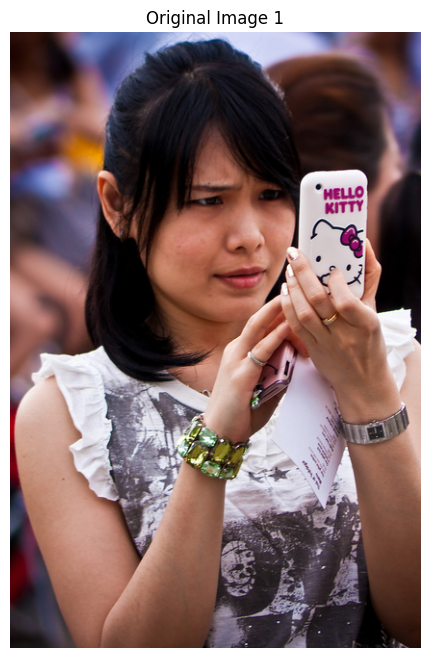

Processing image 2: 000000000724.jpg


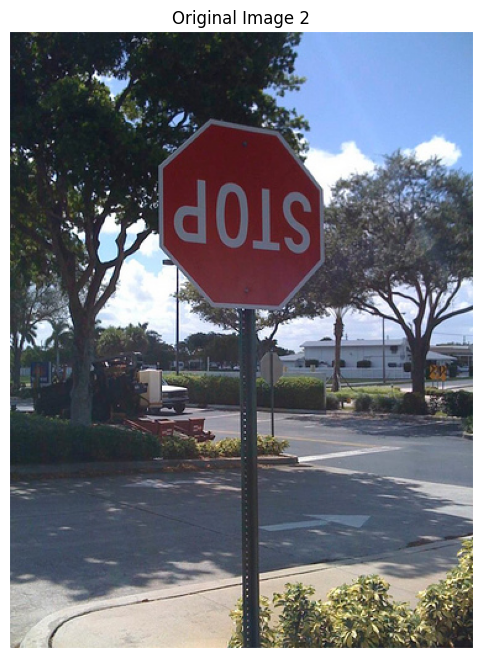

Processing image 3: 000000000285.jpg


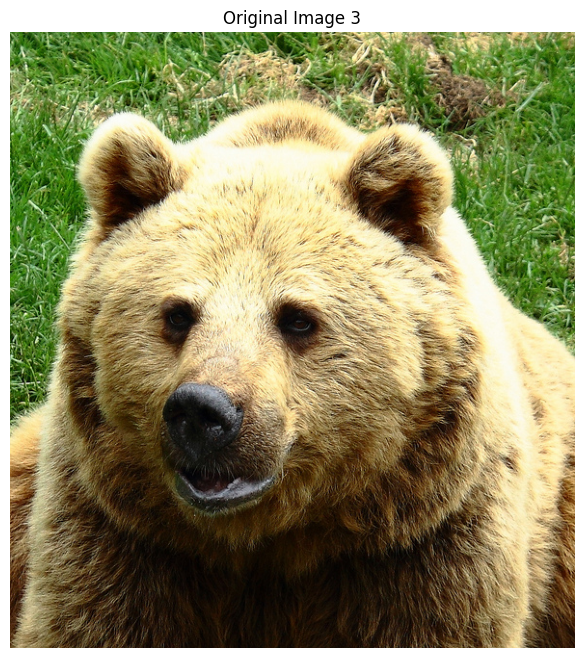

Processing image 4: 000000000785.jpg


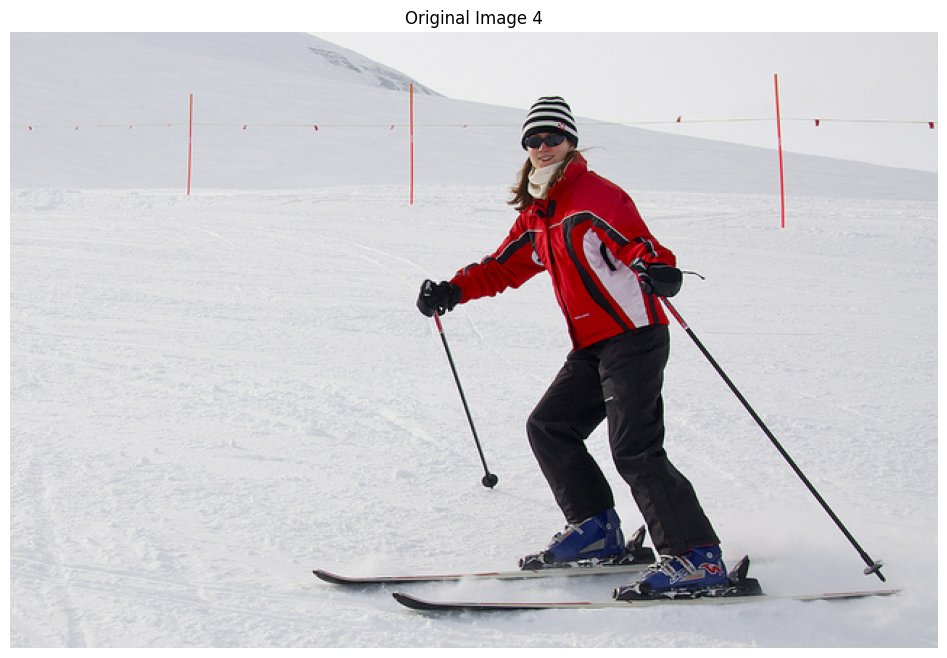

Processing image 5: 000000001000.jpg


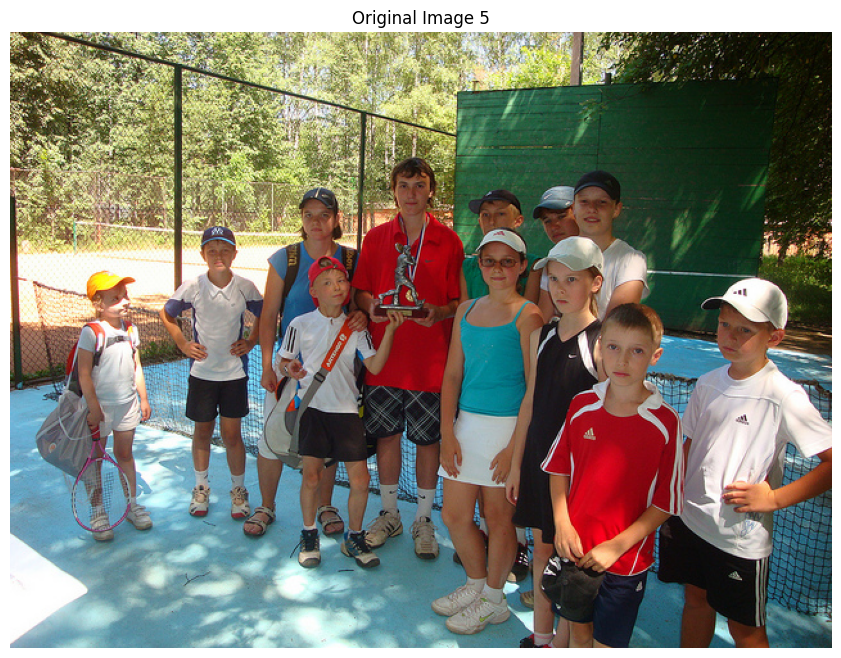

In [ ]:
all_results = {}

for idx, image_path in enumerate(image_paths, start=1):
    print("=" * 80)
    print(f"Processing image {idx}: {os.path.basename(image_path)}")

    image_np = load_image(image_path)
    outputs = run_inference(detector, image_np)

    all_results[image_path] = {
        "image": image_np,
        "outputs": outputs
    }

    show_image(image_np, title=f"Original Image {idx}")

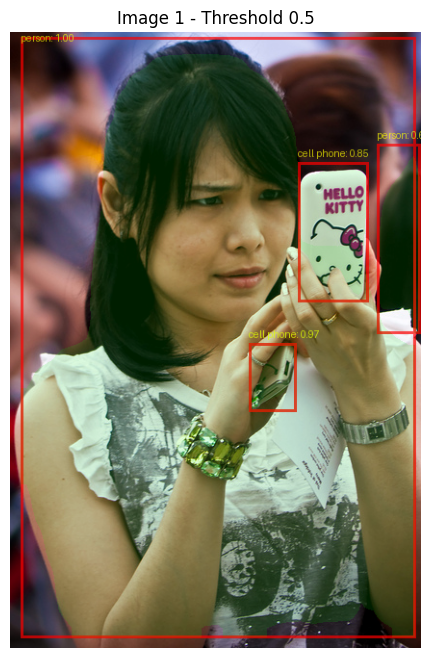

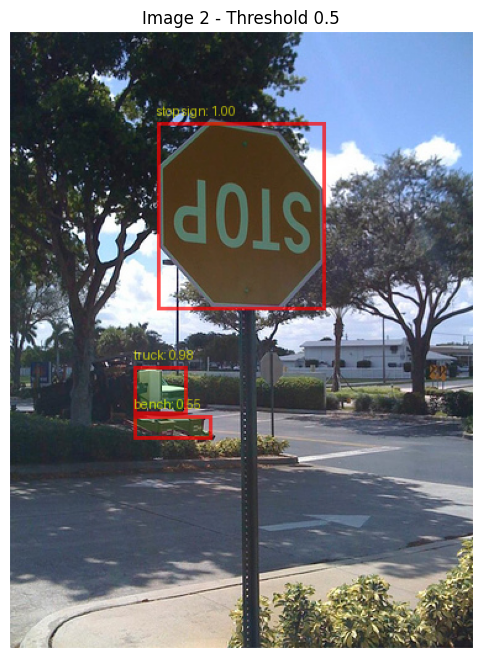

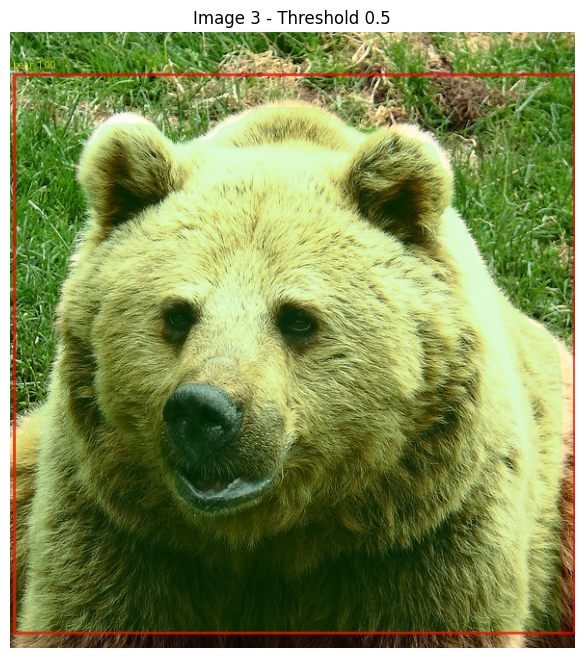

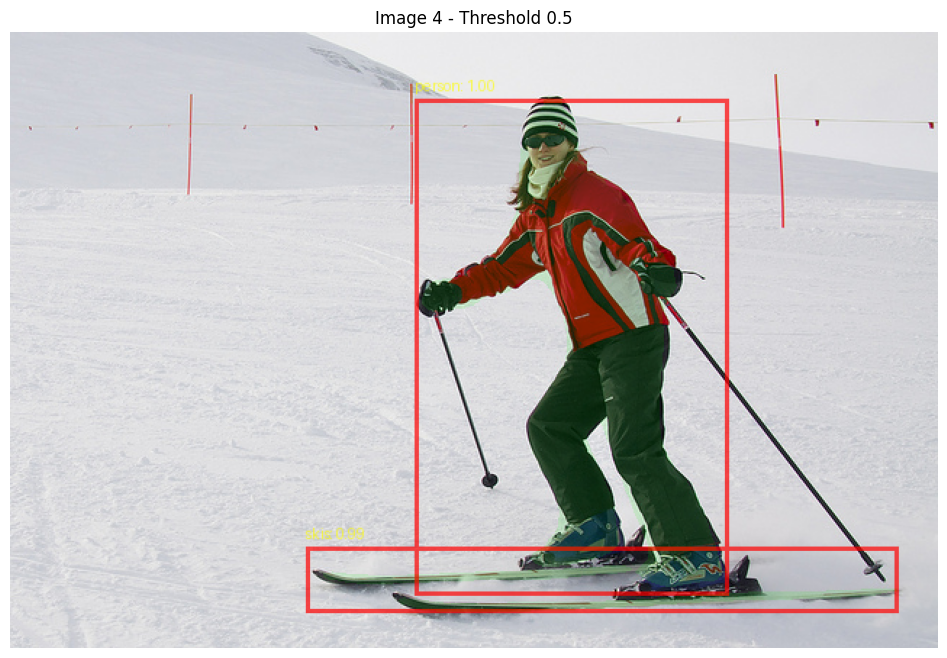

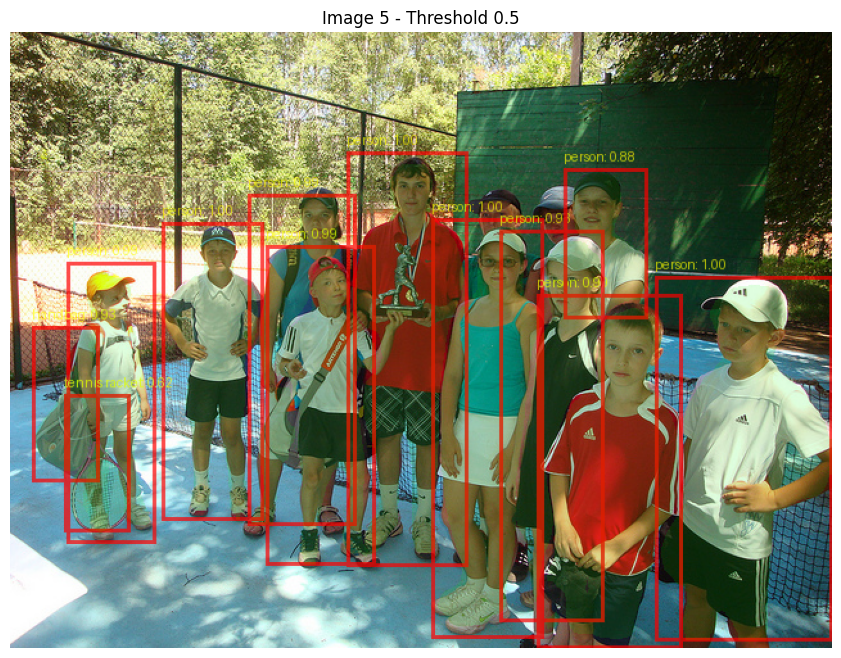

In [ ]:
for idx, (image_path, data) in enumerate(all_results.items(), start=1):
    vis_img = draw_detections(data["image"], data["outputs"], score_thresh=0.5)
    show_image(vis_img, title=f"Image {idx} - Threshold 0.5")

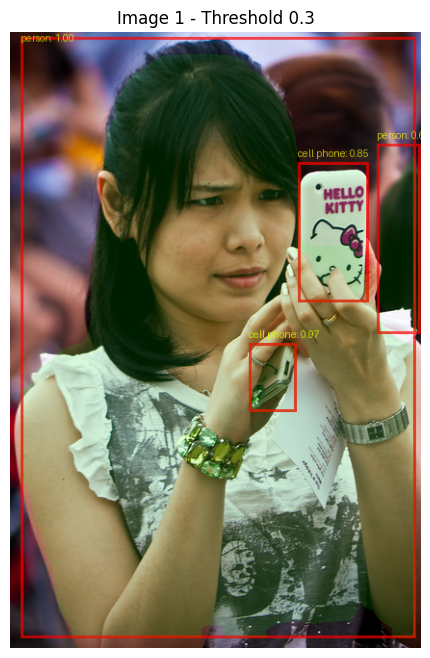

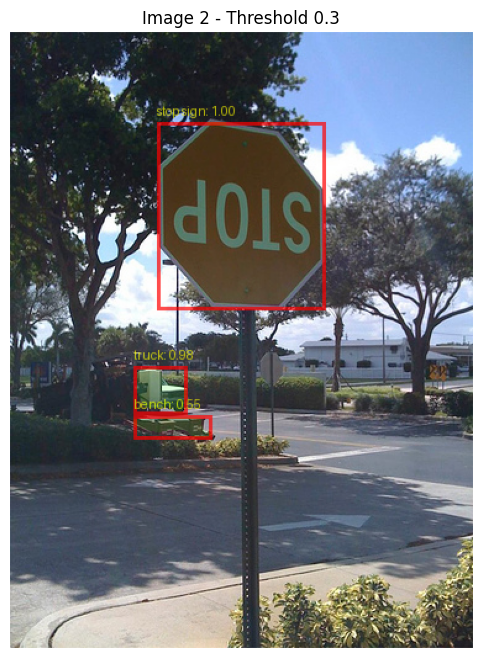

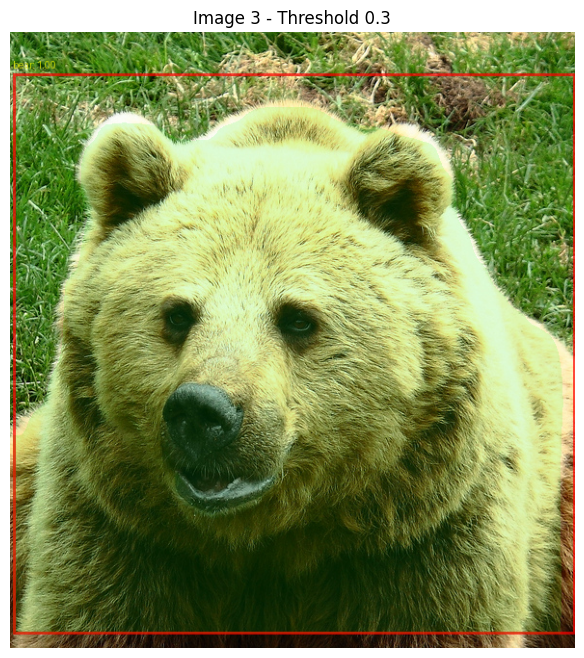

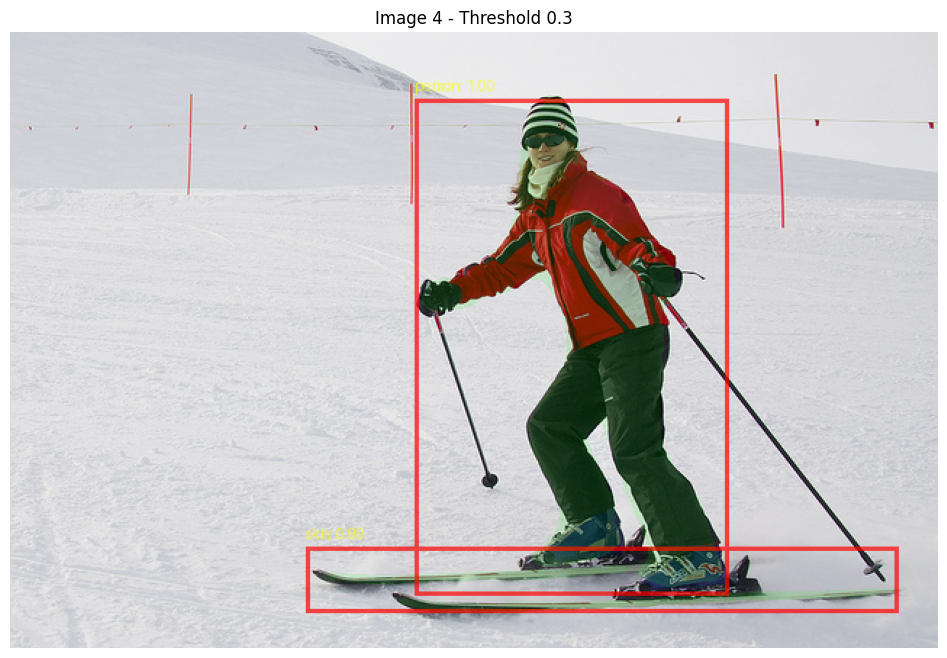

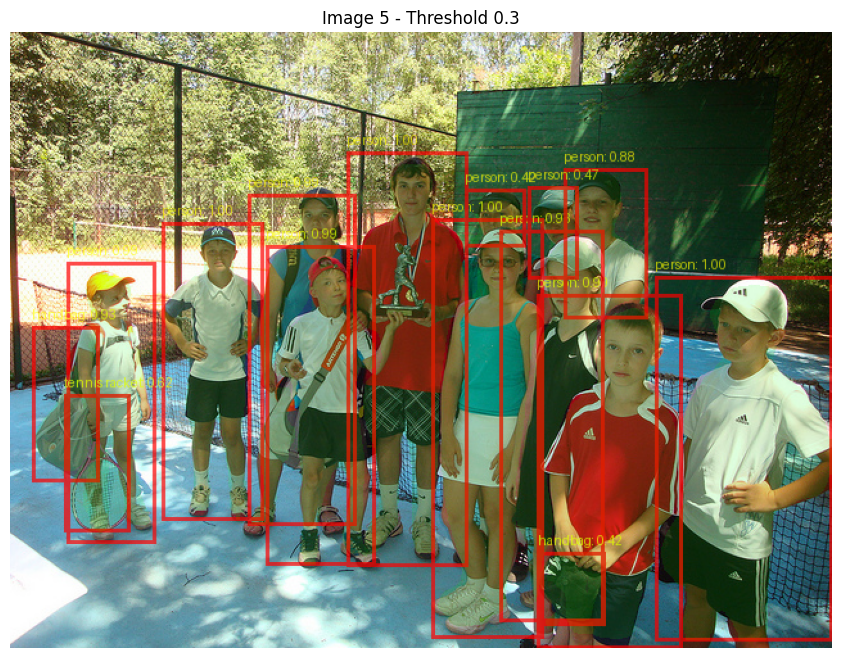

In [ ]:
for idx, (image_path, data) in enumerate(all_results.items(), start=1):
    vis_img = draw_detections(data["image"], data["outputs"], score_thresh=0.3)
    show_image(vis_img, title=f"Image {idx} - Threshold 0.3")

In [ ]:
for idx, (image_path, data) in enumerate(all_results.items(), start=1):
    print("=" * 80)
    print(f"Predictions for Image {idx}: {os.path.basename(image_path)}")
    print("Threshold = 0.5\n")

    preds = extract_predictions(data["outputs"], data["image"], threshold=0.5)

    if len(preds) == 0:
        print("No objects detected.\n")
    else:
        for pred in preds:
            print(f"Object Number : {pred['object_number']}")
            print(f"Class Label   : {pred['class_label']}")
            print(f"Confidence    : {pred['confidence_score']:.3f}")
            print(f"Bounding Box  : {pred['bounding_box']}")
            print(f"Mask Shape    : {pred['mask_shape']}")
            print("-" * 50)

Predictions for Image 1: 000000001296.jpg
Threshold = 0.5

Object Number : 1
Class Label   : person
Confidence    : 0.999
Bounding Box  : [0.007861584424972534, 0.027816593647003174, 0.9842959642410278, 0.9873598217964172]
Mask Shape    : (640, 427)
--------------------------------------------------
Object Number : 2
Class Label   : cell phone
Confidence    : 0.971
Bounding Box  : [0.5050587058067322, 0.581193745136261, 0.6169072985649109, 0.697157084941864]
Mask Shape    : (640, 427)
--------------------------------------------------
Object Number : 3
Class Label   : cell phone
Confidence    : 0.855
Bounding Box  : [0.2113218754529953, 0.700555145740509, 0.4375576376914978, 0.873472273349762]
Mask Shape    : (640, 427)
--------------------------------------------------
Object Number : 4
Class Label   : person
Confidence    : 0.632
Bounding Box  : [0.18240395188331604, 0.8945634365081787, 0.4898574650287628, 0.9994509220123291]
Mask Shape    : (640, 427)
-------------------------------

In [ ]:
for idx, (image_path, data) in enumerate(all_results.items(), start=1):
    print("=" * 80)
    print(f"Predictions for Image {idx}: {os.path.basename(image_path)}")
    print("Threshold = 0.3\n")

    preds = extract_predictions(data["outputs"], data["image"], threshold=0.3)

    if len(preds) == 0:
        print("No objects detected.\n")
    else:
        for pred in preds:
            print(f"Object Number : {pred['object_number']}")
            print(f"Class Label   : {pred['class_label']}")
            print(f"Confidence    : {pred['confidence_score']:.3f}")
            print(f"Bounding Box  : {pred['bounding_box']}")
            print(f"Mask Shape    : {pred['mask_shape']}")
            print("-" * 50)

Predictions for Image 1: 000000001296.jpg
Threshold = 0.3

Object Number : 1
Class Label   : person
Confidence    : 0.999
Bounding Box  : [0.007861584424972534, 0.027816593647003174, 0.9842959642410278, 0.9873598217964172]
Mask Shape    : (640, 427)
--------------------------------------------------
Object Number : 2
Class Label   : cell phone
Confidence    : 0.971
Bounding Box  : [0.5050587058067322, 0.581193745136261, 0.6169072985649109, 0.697157084941864]
Mask Shape    : (640, 427)
--------------------------------------------------
Object Number : 3
Class Label   : cell phone
Confidence    : 0.855
Bounding Box  : [0.2113218754529953, 0.700555145740509, 0.4375576376914978, 0.873472273349762]
Mask Shape    : (640, 427)
--------------------------------------------------
Object Number : 4
Class Label   : person
Confidence    : 0.632
Bounding Box  : [0.18240395188331604, 0.8945634365081787, 0.4898574650287628, 0.9994509220123291]
Mask Shape    : (640, 427)
-------------------------------

In [ ]:
output_dir = "/content/output_results"
os.makedirs(output_dir, exist_ok=True)

for image_path, data in all_results.items():
    name = os.path.splitext(os.path.basename(image_path))[0]

    img05 = draw_detections(data["image"], data["outputs"], score_thresh=0.5)
    img03 = draw_detections(data["image"], data["outputs"], score_thresh=0.3)

    Image.fromarray(img05).save(f"{output_dir}/{name}_thr_05.png")
    Image.fromarray(img03).save(f"{output_dir}/{name}_thr_03.png")

print("Saved all result images.")

Saved all result images.
